<a href="https://colab.research.google.com/github/Daria-Mihaila-1/Kalman-Filter/blob/main/kalman.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import requests
from io import BytesIO

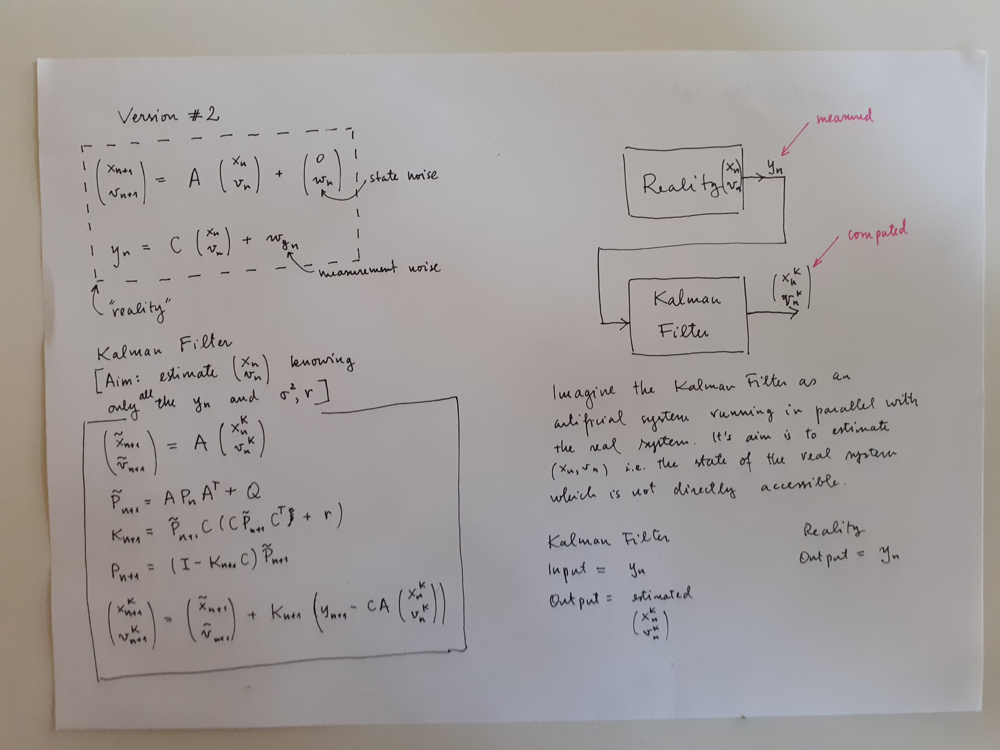

In [ ]:
# URL of the publicly shared image file on Google Drive
file = 'https://drive.google.com/file/d/16VZziGnXcOWlyy_7SDbzUAPV_Gz4FnSm/view?usp=drive_link'
file ='https://drive.google.com/uc?id=' + file.split('/')[-2]

response = requests.get(file)
image = Image.open(BytesIO(response.content))
image.show()

In [ ]:
file = "https://docs.google.com/spreadsheets/d/15l4S554SO0K-j00iaEvqFimzTJEvn-6l/edit?usp=drive_link"
file ='https://drive.google.com/uc?id=' + file.split('/')[-2]
df = pd.read_excel(file)
df.head()


,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,state noise,NaN,measurement noise
1,1.0,-0.009225,NaN,-0.244
2,2.0,0.009845,NaN,-0.065
3,3.0,0.019,NaN,-0.016
4,4.0,0.004768,NaN,0.324


In [ ]:
# loading noises
state_noise_df = df.iloc[1:, 1]
measurement_noise_df = df.iloc[1:, 3]
state_noise = state_noise_df.values.tolist()
measurement_noise = measurement_noise_df.values.tolist()

In [ ]:
def kalman(state_noise_calculated, state_noise, measurement_noise):

  C = np.array([[1, 0]])
  P = np.zeros((2, 2), dtype=int)
  Pt = np.zeros((2, 2), dtype=int)
  # 0.002
  Q = np.array([[0, 0],
                [0, 0.02]])
  K = np.zeros((2, 1), dtype=int)
  # 0.02
  R = np.array([[0],
              [0.2]])
  I = np.eye(2)
  h = 0.05
  A = np.array([[1, h],
                [-h, 1-h*h]])
  init_measurement = np.array([[1],
                              [1]])
  ideal = [init_measurement]

# create pendulum measurements
  for i in range(200):
    init_measurement = np.dot(A, init_measurement)
    if state_noise_calculated:
      init_measurement += state_noise[i]
    ideal.append(init_measurement)

  x, v, y = [], [], []
  x_kalman, v_kalman = [], []
  time = 0
  first = True

  # kalman
  for i in range(200):
    ###
    # exact/perfect knowledge
    ###
    v.append(ideal[i][1])
    x.append(ideal[i][0])
    # 0.1*measurement noise
    yn = np.dot(C, np.array([x[i], v[i]])) + measurement_noise[i]
    y.append(yn)

    ###
    # prediction
    ###

    if first:
      tilda = np.dot(A, np.array([[1], [1]]))
      xk, vk = 1, 1
      first = False
    else:
      xk, vk = new_measurements[0], new_measurements[1]
      tilda = np.dot(A, np.array([xk, vk]))

    Pt = np.dot(np.dot(A, P), A.T) + Q

    ###
    # main update
    ###

    K = np.dot(np.dot(C, Pt), (np.dot(np.dot(C, Pt), C.T) + R))
    P = np.dot((I - np.dot(K, C)), Pt)


    new_measurements = tilda + np.dot(K, (yn-np.dot(np.dot(C, A), [xk, vk])))

    x_kalman.append(new_measurements[0])
    v_kalman.append(new_measurements[1] )
    time += 1


  y = [i[0] for i in y]
  return x, y, v, x_kalman, v_kalman

In [ ]:
# system noise False
x, y, v, x_kalman, v_kalman = kalman(False, state_noise, measurement_noise)

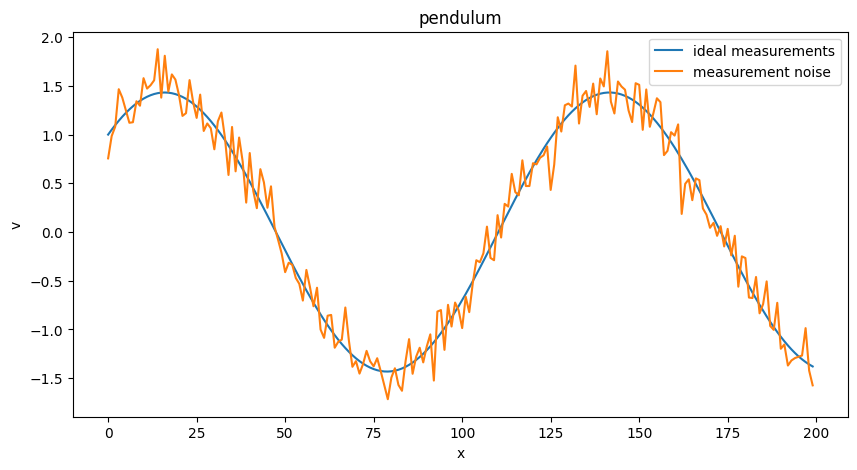

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x, label="ideal measurements")
plt.plot(y, label="measurement noise")

# plt.plot(x, v_state_noise, label="with state noise")
plt.legend()
plt.show()

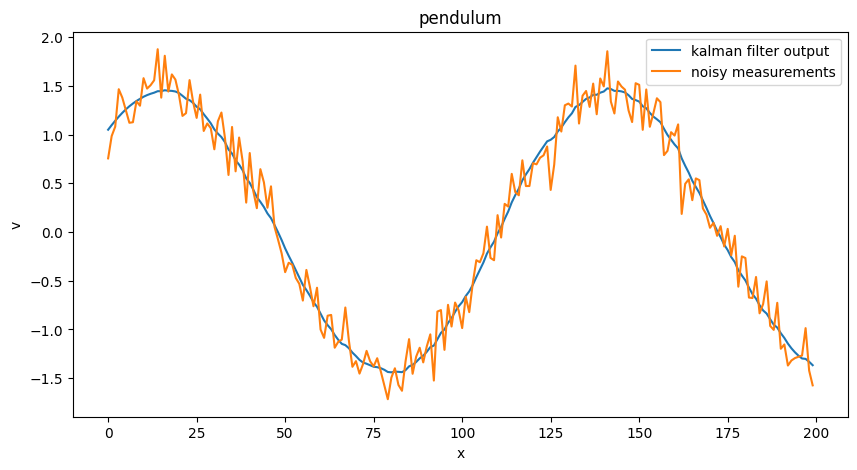

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x_kalman, label="kalman filter output")
plt.plot(y, label="noisy measurements")

plt.legend()
plt.show()

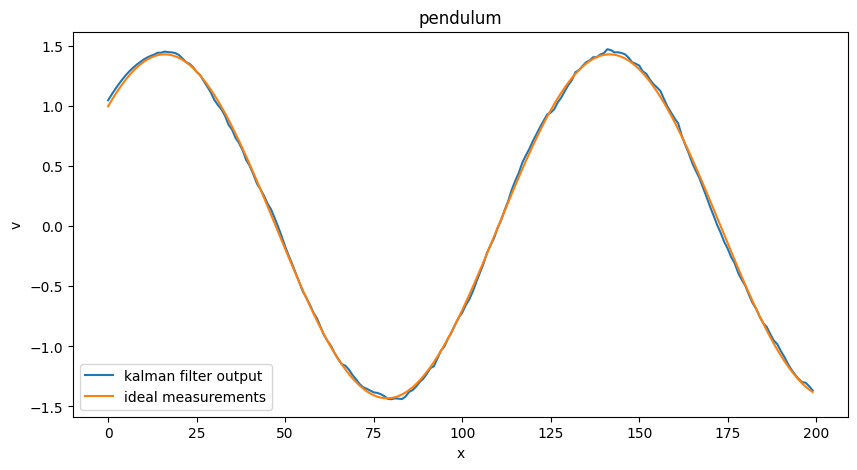

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x_kalman, label="kalman filter output")
plt.plot(x, label="ideal measurements")

plt.legend()
plt.show()

In [ ]:
# system noise True
x, y, v, x_kalman, v_kalman = kalman(True, state_noise, measurement_noise)

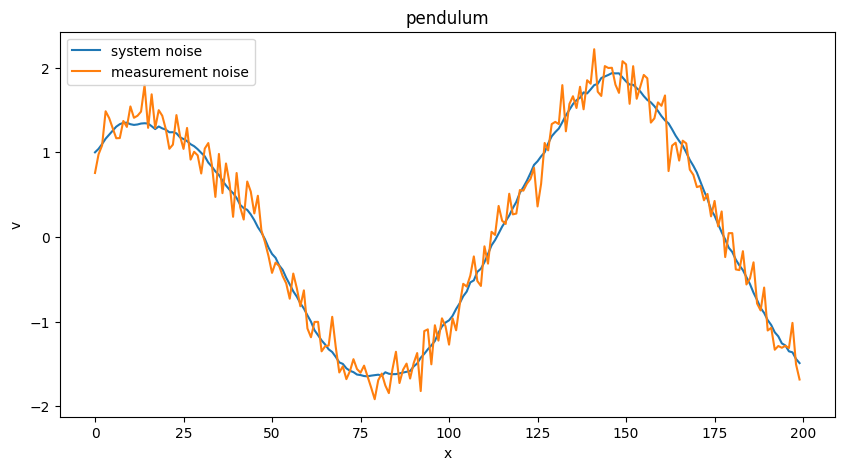

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x, label="system noise")
plt.plot(y, label="measurement noise")

# plt.plot(x, v_state_noise, label="with state noise")
plt.legend()
plt.show()

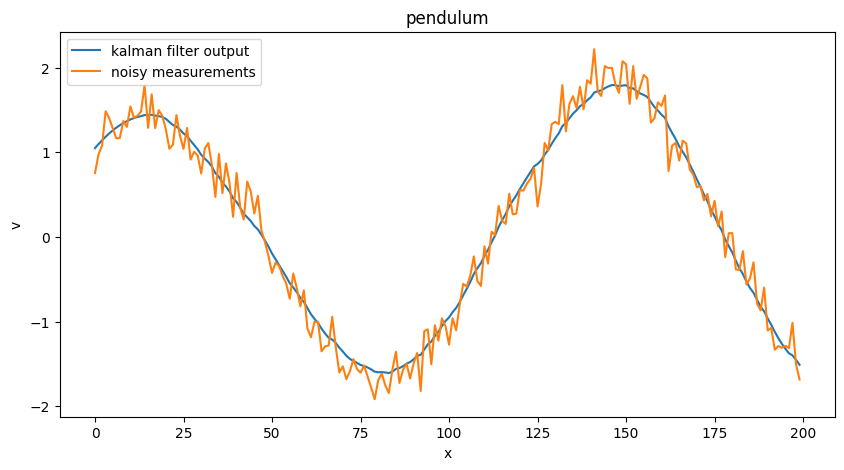

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x_kalman, label="kalman filter output")
plt.plot(y, label="noisy measurements")

plt.legend()
plt.show()

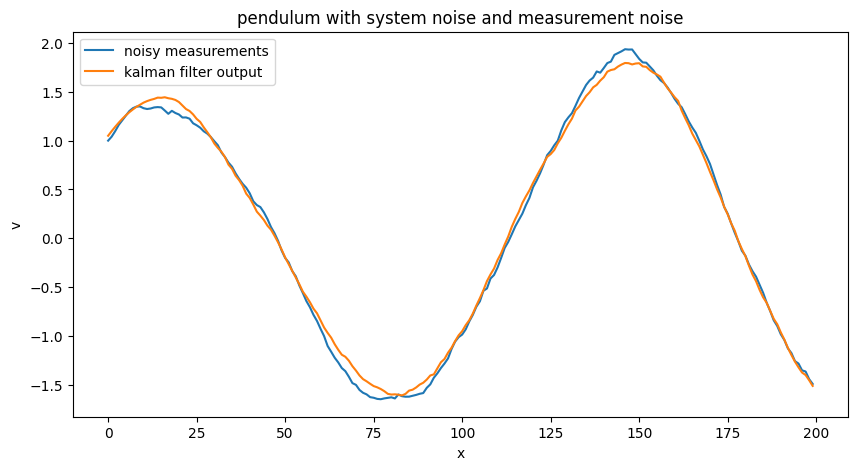

In [ ]:
plt.figure(figsize=(10, 5))

plt.title("pendulum with system noise and measurement noise")
plt.xlabel('x')
plt.ylabel('v')

plt.plot(x, label="noisy measurements")
plt.plot(x_kalman, label="kalman filter output")

plt.legend()
plt.show()

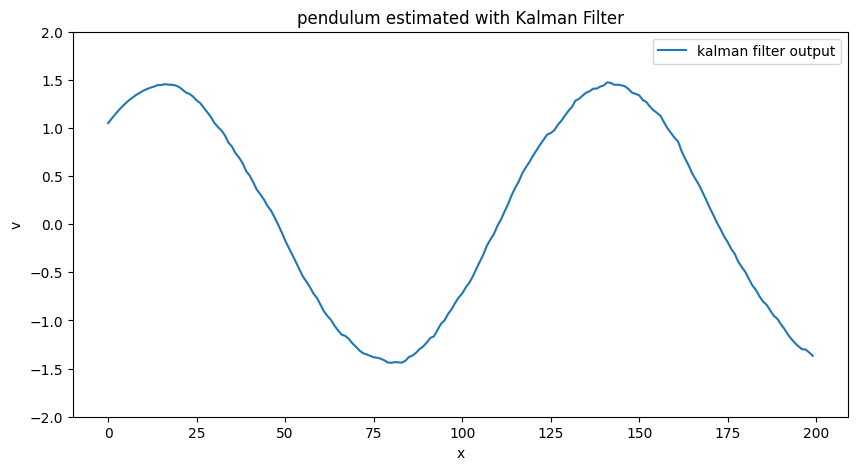

In [ ]:
plt.figure(figsize=(10, 5))
plt.title("pendulum estimated with Kalman Filter")
plt.xlabel('x')
plt.ylabel('v')
plt.ylim(-2, 2)
plt.plot(x_kalman, label="kalman filter output")

plt.legend()
plt.show()